In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import mannwhitneyu, wilcoxon
import numpy as np
import os

In [20]:
os.listdir('../main/log/res/results_def')

['slim_concrete.csv',
 'slim_energy.csv',
 'slim_instanbul.csv',
 'slim_ppb.csv',
 'slim_resid_build_sale_price.csv',
 'slim_toxicity.csv',
 'slim_toxicity_updated.csv']

In [30]:
baselines = {file[5:-4] : pd.read_csv('../main/log/res/results_def/' + file, names=["algo", "experiment_id", "dataset", "seed", "generation",
                                        "training_fitness", "timing", "pop_node_count",
                                        "test_fitness", "elite_size", "log_level"]) for file in os.listdir('../main/log/res/results_def')}

In [33]:
baselines.keys()

dict_keys(['concrete', 'energy', 'instanbul', 'ppb', 'resid_build_sale_price', 'toxicity', 'toxicity_updated'])

In [2]:
logger_name = '../main/log_crossover' + "/newxo_24sep.csv"

data = pd.read_csv(logger_name, names=["algo", "experiment_id", "dataset", "seed", "generation",
                                        "training_fitness", "timing", "pop_node_count",
                                        "test_fitness", "elite_size", "log_level"])

In [3]:
data.algo.unique()

array(['SlimGSGP_1_mul_True_dgx_0.2', 'SlimGSGP_1_mul_True_dgx_0.5',
       'SlimGSGP_1_mul_True_dgx_0.8', 'SlimGSGP_1_mul_False_dgx_0.2',
       'SlimGSGP_1_mul_False_dgx_0.5', 'SlimGSGP_1_mul_False_dgx_0.8',
       'SlimGSGP_2_sum_True_dgx_0.2', 'SlimGSGP_2_sum_True_dgx_0.5',
       'SlimGSGP_2_sum_True_dgx_0.8'], dtype=object)

In [4]:
data.dataset.unique()

array(['toxicity', 'concrete', 'instanbul', 'ppb',
       'resid_build_sale_price', 'energy'], dtype=object)

In [13]:
algo_types = ['SlimGSGP_1_mul_True', 'SlimGSGP_1_mul_False', 'SlimGSGP_2_sum_True']
dataset =['toxicity', 'concrete', 'instanbul', 'ppb',
       'resid_build_sale_price', 'energy']

In [40]:
algo_type

'SlimGSGP_2_sum_True'

In [43]:
baselines[input_].algo.unique()

array(['SlimGSGP_1_mul_False', 'SlimGSGP_1_sum_False',
       'SlimGSGP_2_mul_False', 'SlimGSGP_2_sum_False',
       'SlimGSGP_1_mul_True', 'SlimGSGP_1_sum_True'], dtype=object)

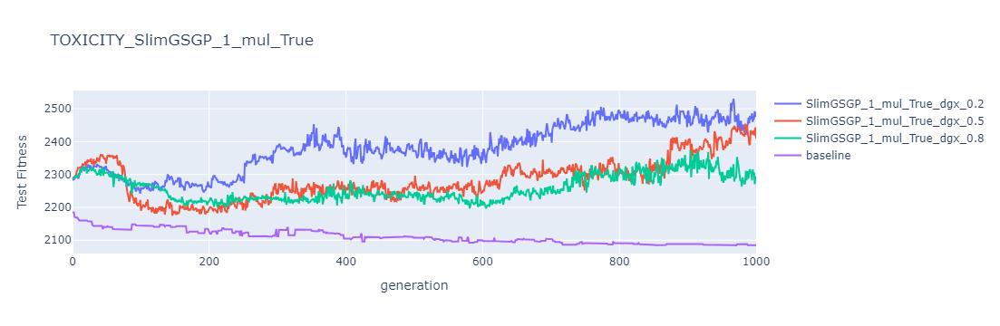

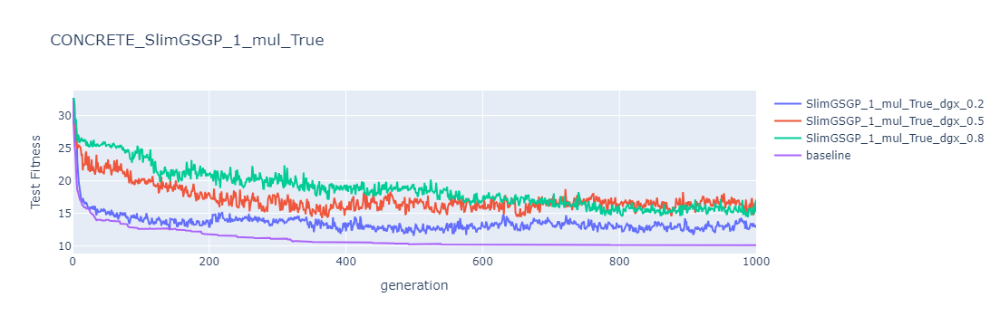

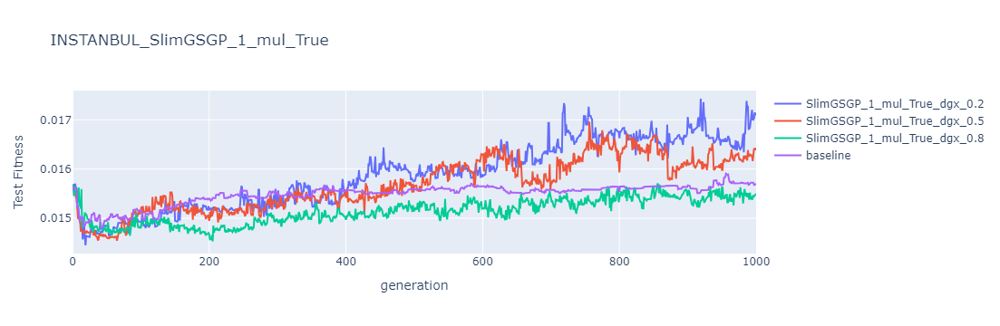

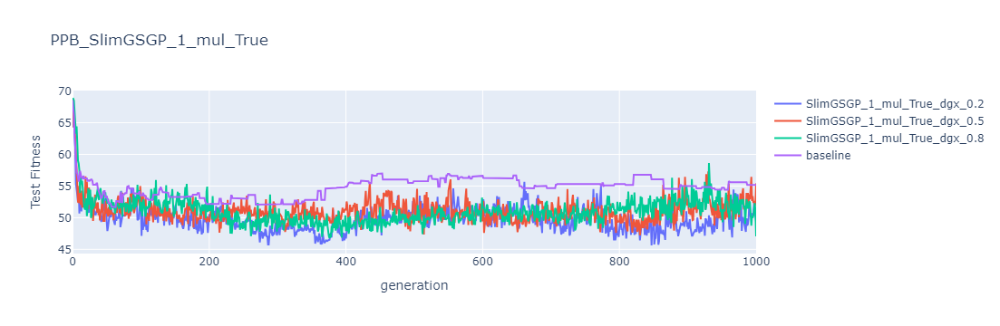

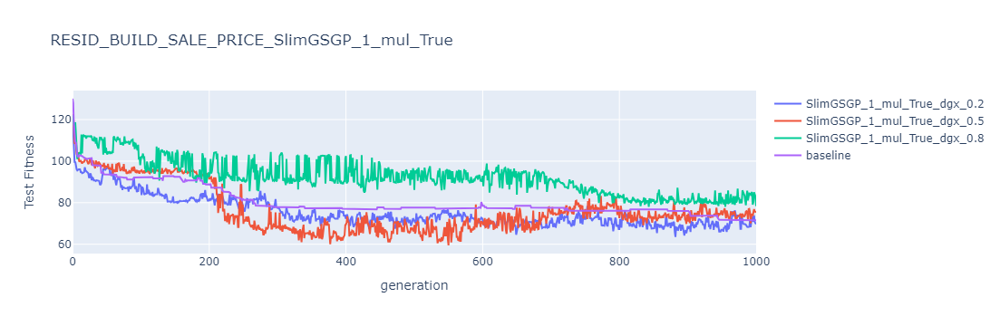

...

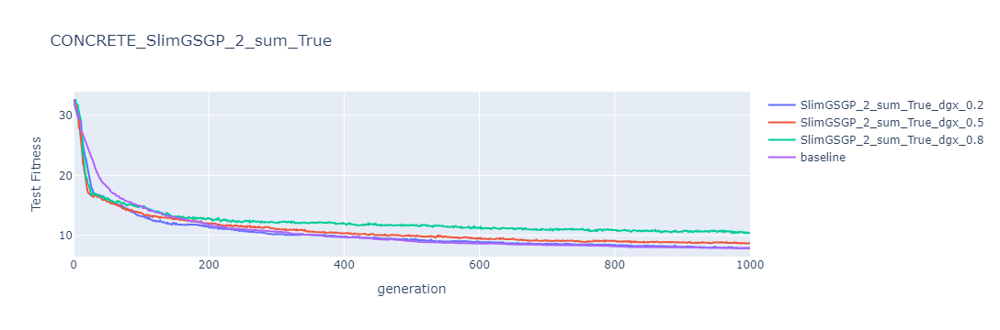

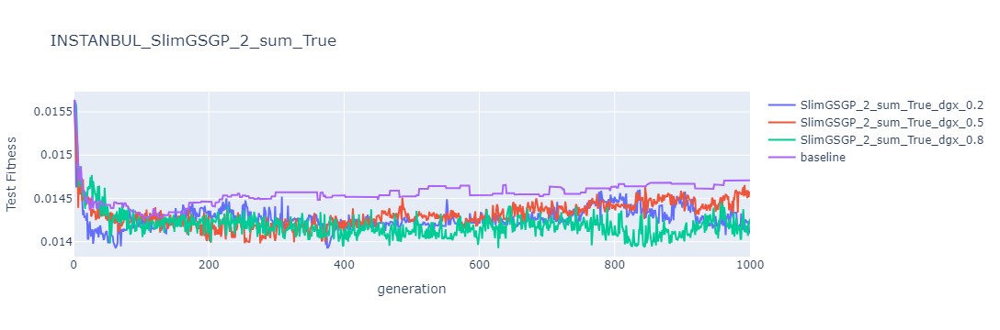

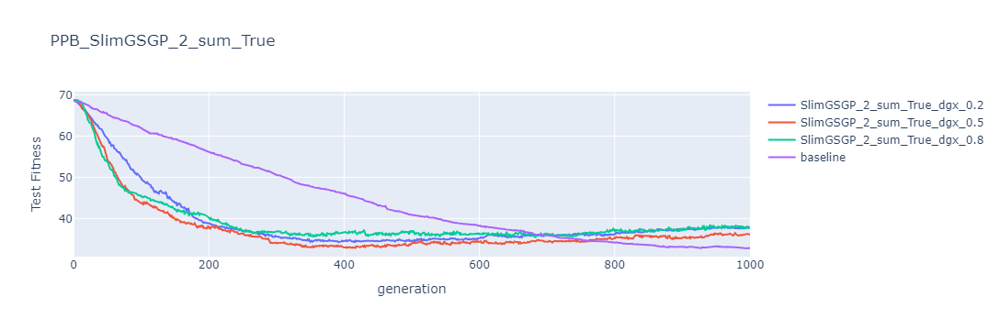

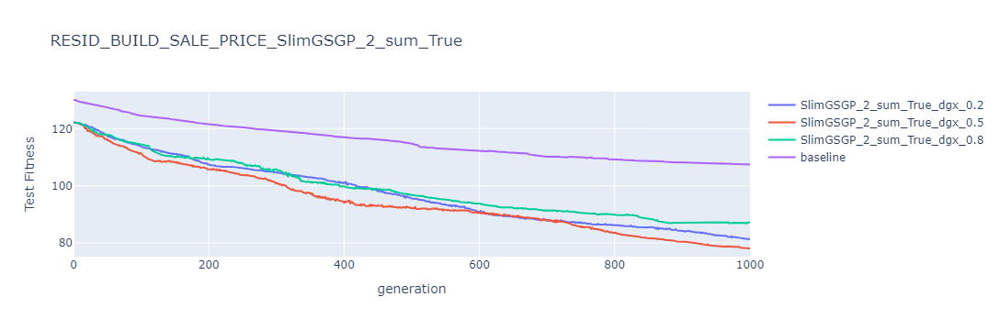

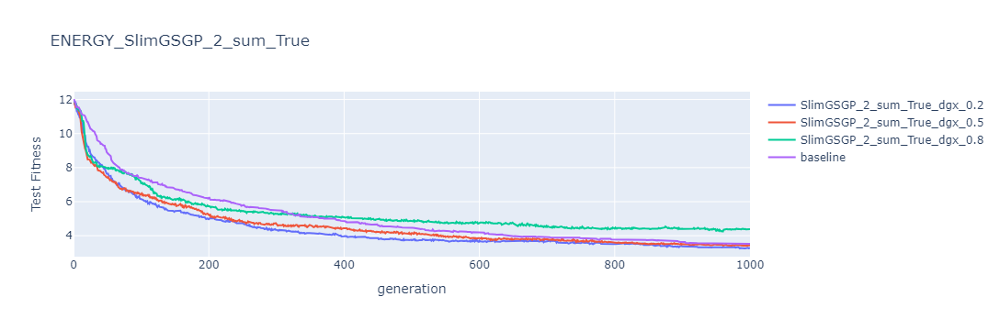

In [44]:
for algo_type in algo_types:
    for input_ in dataset:
        fig = go.Figure()
        for res_data in list(filter(lambda x: algo_type in x[:25], data.algo.unique())):
            data_fitered = data.query("dataset == @input_ and algo == @res_data")[['test_fitness', 'generation']].groupby('generation').median()
            
            fig.add_trace(go.Scatter(y=data_fitered['test_fitness'], x=data_fitered.index,
                              name = res_data))
        
        if algo_type == 'SlimGSGP_2_sum_True':
            algo1 = 'SlimGSGP_2_sum_False'
        else:
            algo1 = algo_type
            
        b_filtered = baselines[input_].query("algo == @algo1 and generation <= 1000")[['test_fitness', 'generation']].groupby('generation').median()
        
        fig.add_trace(go.Scatter(y=b_filtered['test_fitness'], x=b_filtered.index,
                              name = 'baseline'))
        
        fig.update_layout(title_text=f'{input_.upper()}_{algo_type}',
                         xaxis_title="generation",
                         yaxis_title="Test Fitness") 
        fig.show()

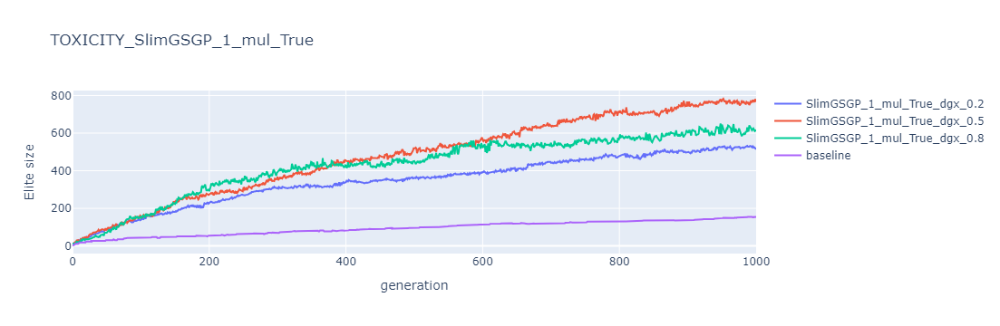

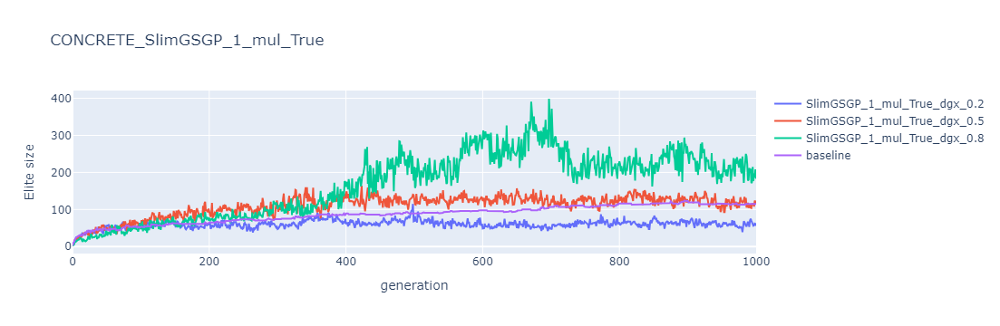

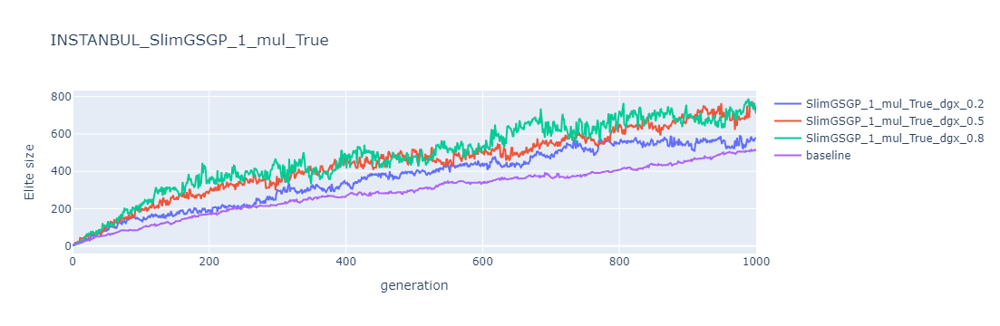

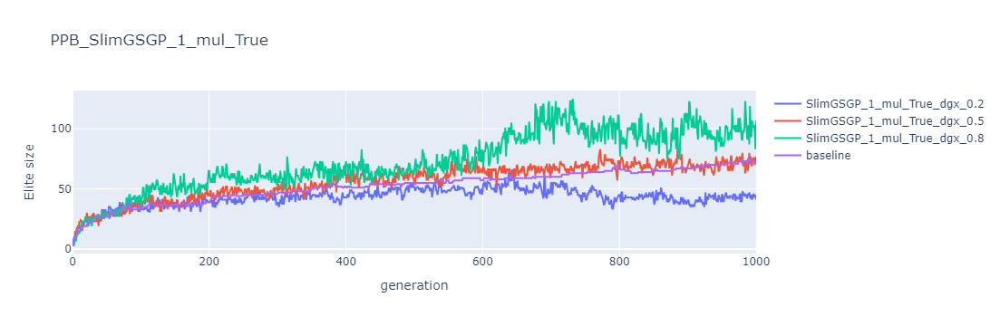

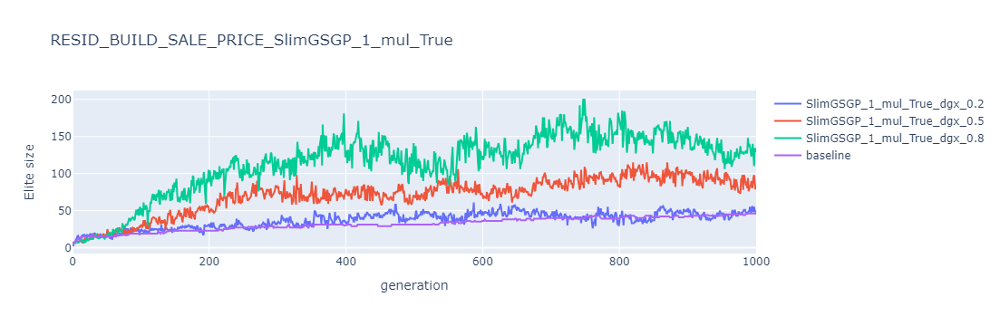

...

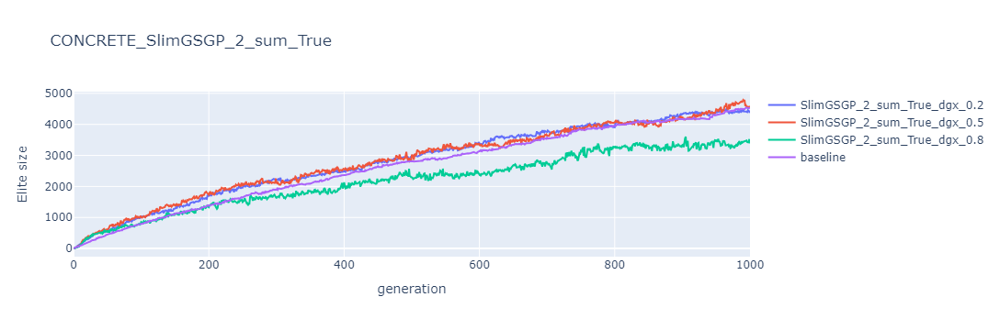

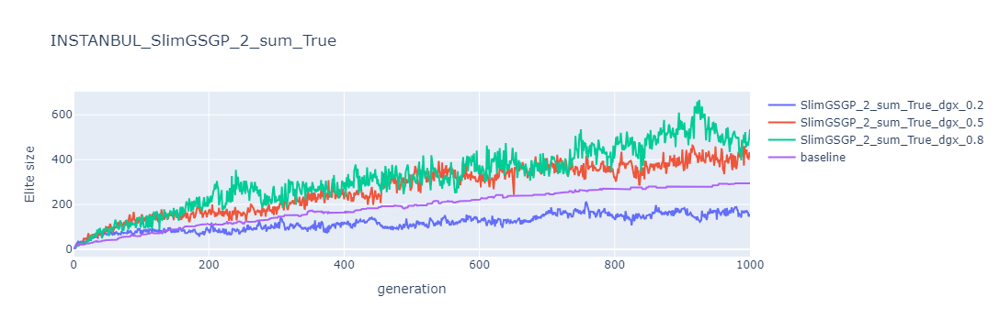

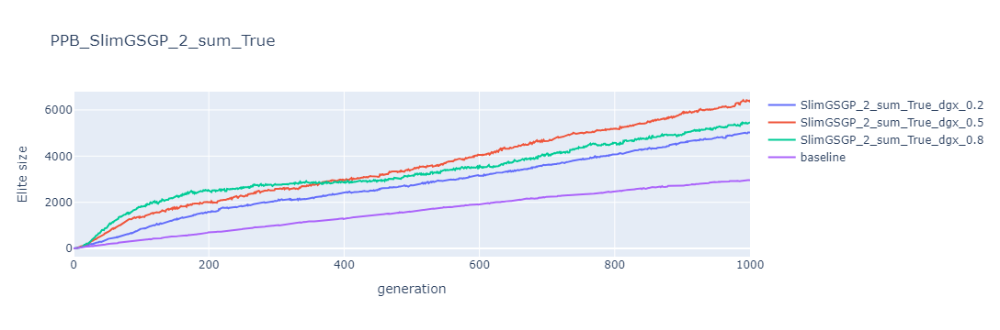

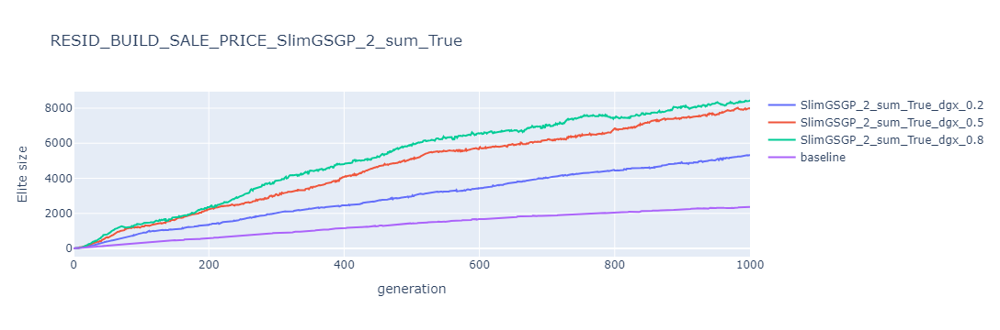

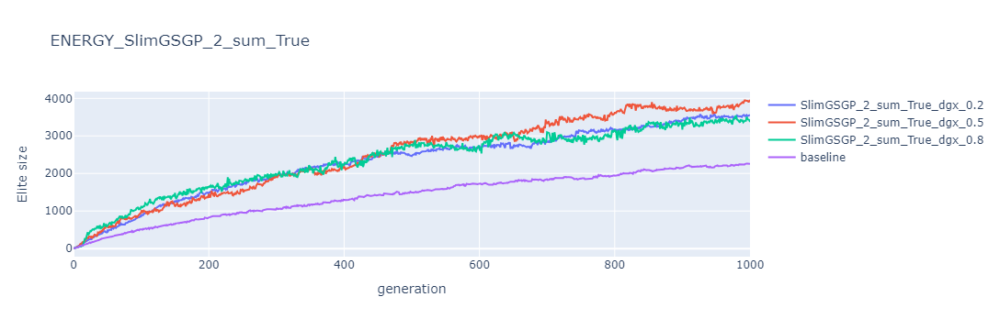

In [46]:
for algo_type in algo_types:
    for input_ in dataset:
        fig = go.Figure()
        for res_data in list(filter(lambda x: algo_type in x[:25], data.algo.unique())):
            data_fitered = data.query("dataset == @input_ and algo == @res_data")[['elite_size', 'generation']].groupby('generation').median()
            
            fig.add_trace(go.Scatter(y=data_fitered['elite_size'], x=data_fitered.index,
                              name = res_data))

        if algo_type == 'SlimGSGP_2_sum_True':
            algo1 = 'SlimGSGP_2_sum_False'
        else:
            algo1 = algo_type
            
        b_filtered = baselines[input_].query("algo == @algo1 and generation <= 1000")[['elite_size', 'generation']].groupby('generation').median()
        
        fig.add_trace(go.Scatter(y=b_filtered['elite_size'], x=b_filtered.index,
                              name = 'baseline'))
        
        fig.update_layout(title_text=f'{input_.upper()}_{algo_type}',
                         xaxis_title="generation",
                         yaxis_title="Elite size") 

        
        
        # fig.update_layout(yaxis=dict(range=[0,2500]))
        fig.show()